In [44]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms,datasets
import matplotlib.pyplot as plt 
import os
import kagglehub
import time
import numpy as np


In [3]:
path = kagglehub.dataset_download("kritikseth/fruit-and-vegetable-image-recognition")

print("Path to dataset files:", path)

100%|██████████| 1.98G/1.98G [07:19<00:00, 4.85MB/s]

Extracting files...


Path to dataset files: C:\Users\Arun\.cache\kagglehub\datasets\kritikseth\fruit-and-vegetable-image-recognition\versions\8


In [5]:
os.listdir(path) 

['test', 'train', 'validation']

In [7]:
classes = os.listdir(path + '/train')
classes

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

In [8]:
len(classes)

36

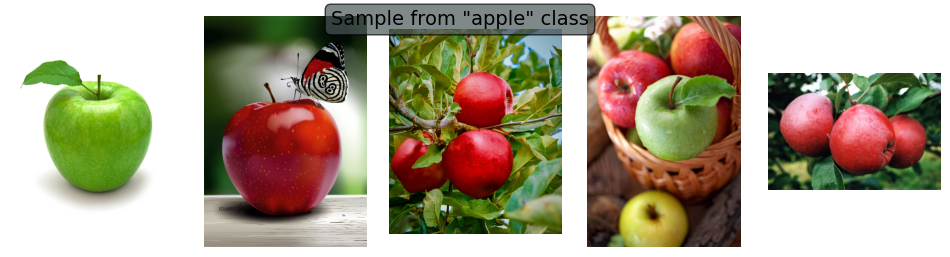

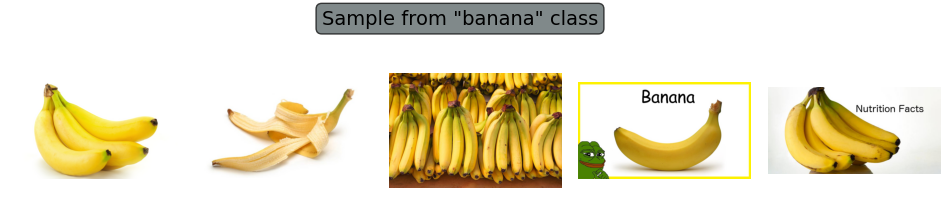

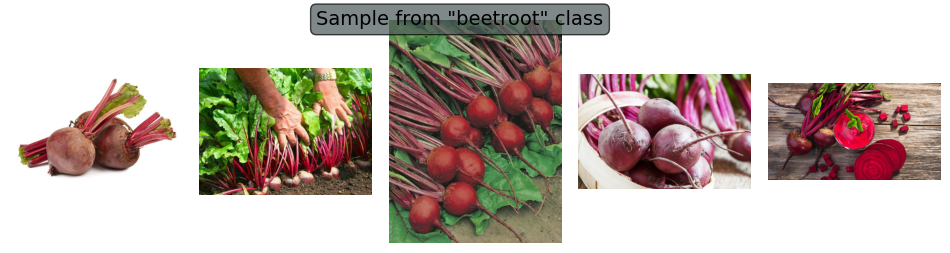

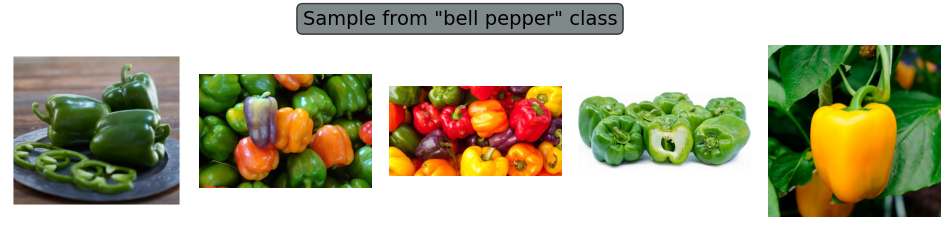

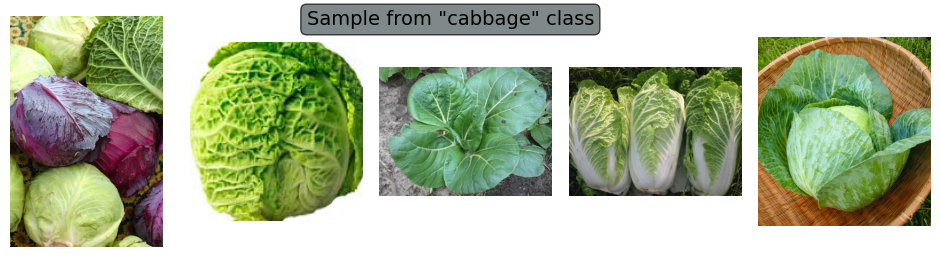

...

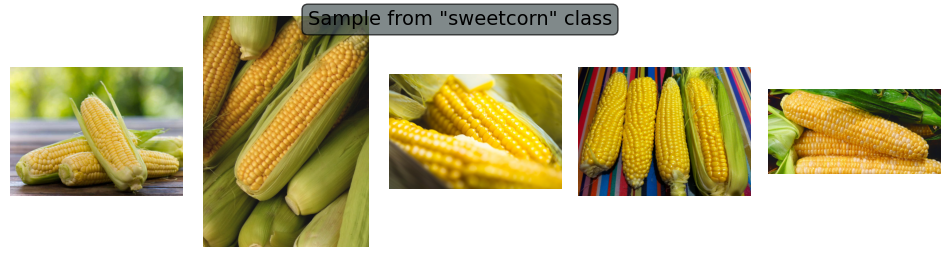

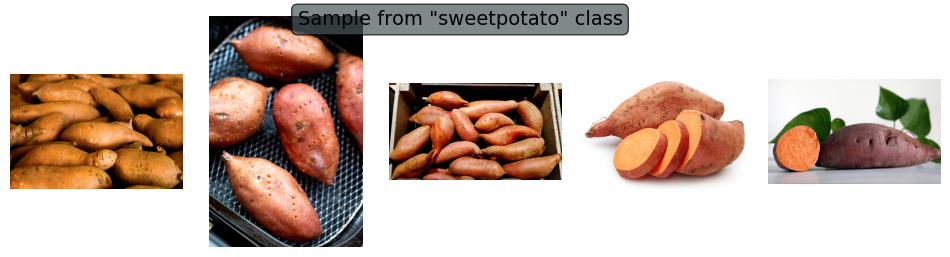

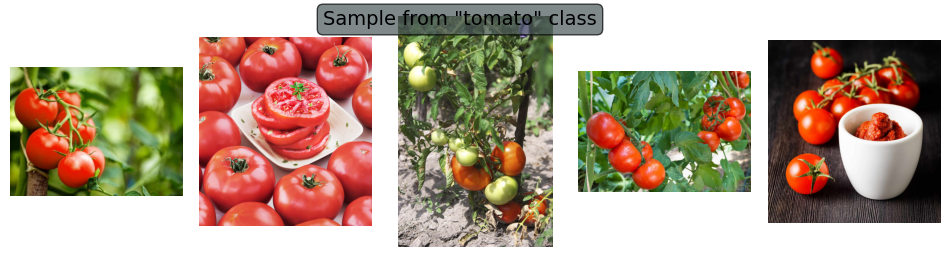

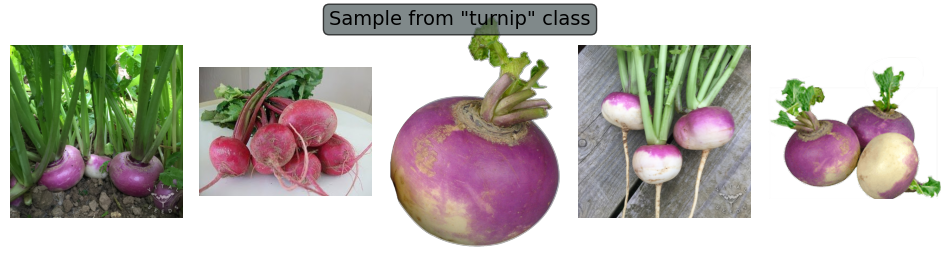

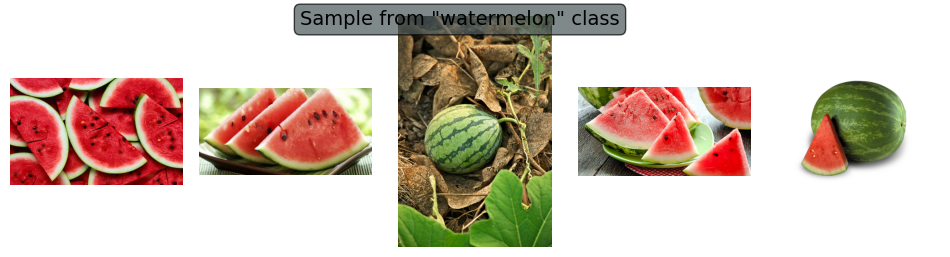

In [13]:
import random
from PIL import Image
for fruits_veg_class in classes:
    class_dir = os.path.join(path + '/train', fruits_veg_class)
    image_path = os.listdir(class_dir)
    random_images = random.sample(image_path, k = 5)   
    fig, ax = plt.subplots(1,5, figsize = (12,3))  
    plt.suptitle(f'Sample from "{fruits_veg_class}" class', fontsize = 14 
                 , bbox=dict(facecolor='#4A5759', alpha=0.7 , boxstyle='round,pad=0.3') , y = 0.9) # Title for each sample
    
    for i , random_image in enumerate(random_images) : # Loop for each image
        image_path = os.path.join(class_dir , random_image) # Creating image path
        image = Image.open(image_path) # Load image
        
        ax[i].imshow(image) # Plot image
        ax[i].axis('off') # Remove the axis
    
    plt.subplots_adjust( hspace = -0.2 , wspace = 0.1 )
    plt.show()
    print('\n')

In [18]:
transform = transforms.Compose([
    transforms.Resize((224 , 224)) ,
    transforms.RandomHorizontalFlip() ,
    transforms.ToTensor() ,
    transforms.Normalize( mean = 0 , std = 1)
])

In [19]:
train_dataset = datasets.ImageFolder(root = path + '/train' , transform = transform) 
train_dataset

Dataset ImageFolder
    Number of datapoints: 3115
    Root location: C:\Users\Arun\.cache\kagglehub\datasets\kritikseth\fruit-and-vegetable-image-recognition\versions\8/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=0, std=1)
           )

In [21]:
test_dataset = datasets.ImageFolder(root = path + '/test' , transform = transform) 
test_dataset

Dataset ImageFolder
    Number of datapoints: 359
    Root location: C:\Users\Arun\.cache\kagglehub\datasets\kritikseth\fruit-and-vegetable-image-recognition\versions\8/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=0, std=1)
           )

In [22]:
val_dataset = datasets.ImageFolder(root = path + '/validation' , transform = transform) 
val_dataset

Dataset ImageFolder
    Number of datapoints: 351
    Root location: C:\Users\Arun\.cache\kagglehub\datasets\kritikseth\fruit-and-vegetable-image-recognition\versions\8/validation
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=0, std=1)
           )

In [26]:
train = DataLoader(dataset=train_dataset,
                   batch_size=32,
                   shuffle=True,
                   num_workers=2
                   )
test = DataLoader(dataset=test_dataset,
                   batch_size=32,
                   shuffle=True,
                   num_workers=2
                   )
val = DataLoader(dataset=val_dataset,
                   batch_size=32,
                   shuffle=True,
                   num_workers=2
                   )

In [28]:
device = ("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")

Using cpu device


In [39]:
class ProduceClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        con1_in, con1_out = (3,32)
        self.cl1 = nn.Conv2d(in_channels=con1_in, out_channels=con1_out, stride=1, kernel_size=(3,3))
        self.bn1 = nn.BatchNorm2d(con1_out)
        self.af1 = nn.ReLU()

        con2_in, con2_out = (con1_out,64)
        self.cl2 = nn.Conv2d(in_channels=con2_in, out_channels=con2_out, stride=1, kernel_size=(3,3))
        self.af2 = nn.ReLU()
        self.mxpool2 = nn.MaxPool2d(kernel_size=(2,2), stride=2)
        
        con3_in, con3_out = (con2_out,64)
        self.cl3 = nn.Conv2d(in_channels=con3_in, out_channels=con3_out, stride=1, kernel_size=(3,3))
        self.bn3 = nn.BatchNorm2d(con3_out)
        self.af3 = nn.ReLU()
        
        con4_in, con4_out = (con3_out,128)
        self.cl4 = nn.Conv2d(in_channels=con4_in, out_channels=con4_out, stride=1, kernel_size=(3,3))
        self.bn4 = nn.BatchNorm2d(con4_out)
        self.af4 = nn.ReLU()
        self.mxpool4 = nn.MaxPool2d(kernel_size=(2,2), stride=2)
        
        ful_con1_in, ful_con1_out =(53*53*con4_out, 1024)
        self.fc1 = nn.Linear(in_features= ful_con1_in, out_features=ful_con1_out)
        self.fc_ac1 = nn.ReLU()

        ful_con2_in, ful_con2_out =(ful_con1_out, 36)
        self.fc2 = nn.Linear(in_features= ful_con2_in, out_features=ful_con2_out)

    def forward(self, x):
        conLayer1 = self.af1(self.bn1(self.cl1(x)))
        conLayer2 = self.mxpool2(self.af2(self.cl2(conLayer1)))
        conLayer3 = self.af3(self.bn3(self.cl3(conLayer2)))
        conLayer4 = self.mxpool4(self.af4(self.bn4(self.cl4(conLayer3))))
        flattenOutput = torch.flatten(conLayer4 , 1)
        fullyConnected1 = self.fc_ac1(self.fc1(flattenOutput))
        return self.fc2(fullyConnected1)
    
model = ProduceClassifier()
model.to(device)
model
        

ProduceClassifier(
  (cl1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (af1): ReLU()
  (cl2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (af2): ReLU()
  (mxpool2): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  (cl3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (af3): ReLU()
  (cl4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (af4): ReLU()
  (mxpool4): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=359552, out_features=1024, bias=True)
  (fc_ac1): ReLU()
  (fc2): Linear(in_features=1024, out_features=36, bias=True)
)

In [40]:
from torchsummary import summary
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 222, 222]             896
       BatchNorm2d-2         [-1, 32, 222, 222]              64
              ReLU-3         [-1, 32, 222, 222]               0
            Conv2d-4         [-1, 64, 220, 220]          18,496
              ReLU-5         [-1, 64, 220, 220]               0
         MaxPool2d-6         [-1, 64, 110, 110]               0
            Conv2d-7         [-1, 64, 108, 108]          36,928
       BatchNorm2d-8         [-1, 64, 108, 108]             128
              ReLU-9         [-1, 64, 108, 108]               0
           Conv2d-10        [-1, 128, 106, 106]          73,856
      BatchNorm2d-11        [-1, 128, 106, 106]             256
             ReLU-12        [-1, 128, 106, 106]               0
        MaxPool2d-13          [-1, 128, 53, 53]               0
           Linear-14                 [-

In [41]:
class EarlyStop :
    
    def __init__(self , patience , min_delta , start_from_epoch) :
        self.patience = patience
        self.min_delta = min_delta
        self.start_from_epoch = start_from_epoch
        self.counter = 0
        self.best_val_loss = None
        self.early_stop = False
        
    def __call__(self , val_loss , epoch) :
        
        if self.start_from_epoch <= epoch :
    
            if self.best_val_loss == None :
                self.best_val_loss = val_loss
                
            elif (val_loss<self.best_val_loss) and ((self.best_val_loss-val_loss > self.min_delta )) :
                self.best_val_loss = val_loss
                self.counter = 0
                
            elif val_loss>=self.best_val_loss :
                self.counter += 1
                
                if self.counter == self.patience :
                    self.early_stop = True
                    

In [42]:
train_size = len(train)
val_size = len(val)
test_size = len(test)

In [ ]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

Scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer = optimizer ,
    factor = 0.5 , 
    patience = 2 , 
    threshold = 0.001,
    min_lr = 1e-5)

early_stopping = EarlyStop(
    min_delta = 0.001 , 
    patience = 5 , 
    start_from_epoch = 5) 

num_epochs = 20

train_losses = []
val_losses = []
train_accs = []
val_accs = []
best_val_loss = float('inf') 
learning_rate = []

training_start_time = time.time()
for epoch in range(num_epochs) :
    
    print(f'Epoch [{epoch+1}/{num_epochs}]\n-------------------------------')
    train_loss = []
    val_loss = []
    corrected_train = 0
    corrected_val = 0
    model.train()
    
    epoch_start_time = time.time()

    for batch , (X , y) in enumerate(train) :
        
        X = X.to(device)
        y = y.to(device)
        
        train_batch_pred = model(X)
        loss = loss_fn(train_batch_pred , y)
        
        loss.backward() 
        optimizer.step()
        
        optimizer.zero_grad()
        
        train_loss.append(loss.item())
        _ , pred_label = torch.max(train_batch_pred , 1)
        corrected_train += (pred_label == y).sum().item()
        
        if batch % 200 == 0:

            print(f"loss: {np.mean(train_loss):>7f}  [{batch:>3d}/{len(train):>3d}]")
    
    train_loss = np.mean(train_loss)
    train_losses.append(train_loss)
    train_accs.append((corrected_train/train_size)*100)
    
    model.eval()
    
    with torch.no_grad(): 
        for X , y in val :
            X = X.to(device)
            y = y.to(device)
            
            val_batch_pred = model(X)
            loss = loss_fn(val_batch_pred , y)
            
            val_loss.append(loss.item())
            _ , pred_label = torch.max(val_batch_pred , 1)
            corrected_val += (pred_label == y).sum().item()
      
    val_loss = np.mean(val_loss)
    val_losses.append(val_loss)
    val_accs.append((corrected_val/val_size)*100)
    
    for param_group in optimizer.param_groups:
        print(f"Current learning rate: {param_group['lr']}")
        learning_rate.append(param_group['lr'])

    Scheduler.step(val_loss)
    
    if val_loss<best_val_loss :
        best_val_loss = val_loss
        best_model_wts = model.state_dict()
        print("Best model weights saved.")
        
    epoch_end_time = time.time()
    epoch_time = epoch_end_time - epoch_start_time

    print(f'Errors : \n'
          f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accs[epoch]:.4f} | '
          f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accs[epoch]:.4f} | '
          f'Duration: {(epoch_time//60)} minutes and {(epoch_time%60):.2f} seconds')
    print('\n'*2)
    early_stopping(val_loss , epoch)
    if early_stopping.early_stop :
        print("Early stopping triggered!")
        break
        
training_end_time = time.time()
duration = training_end_time - training_start_time
print(f"\nTotal training time : {(duration//60)} minutes and {(duration%60):.2f} seconds")



In [46]:
import pandas as pd 
import tabulate
history = {
    'Train_Loss': train_losses,
    'Val_Loss': val_losses,
    'Train_Accuracy': train_accs,
    'Val_Accuracy': val_accs,
    'Learning Rate': learning_rate}
model_performance = pd.DataFrame(history)
print(tabulate(model_performance, headers='keys', tablefmt='psql'))

NameError: name 'train_losses' is not defined

In [ ]:
test_pred_label = []
true_labels = []

with torch.no_grad():
    
    model.eval() 
    test_loss = []
    corrected_test = 0

    for X , y in test :

        X = X.to(device)
        y = y.to(device)

        test_batch_pred = model(X)
        loss = loss_fn(test_batch_pred , y)

        test_loss.append(loss.item())
        _ , pred_label = torch.max(test_batch_pred , 1)
        corrected_test += (pred_label == y).sum().item()
        
        test_pred_label.extend(pred_label.cpu().numpy())
        true_labels.extend(y.cpu().numpy())
       
    test_pred_label = np.array(test_pred_label)
    true_labels = np.array(true_labels)
       
    test_loss = np.mean(val_loss)
    test_acc = (corrected_test/test_size)*100
    
    # Display the evaluation results with clear and formatted output
    print("\nModel Test Results:")
    print(f'Loss: {test_loss:.4f}')
    print(f'Accuracy: {test_acc}%')

    